In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

In [6]:
# Define paths
base_path = Path("satlite_gap/satlite_gap")
reference_sources = [
    base_path / "Google_Map_Tiles(0).tif",
    base_path / "Google_Map_Tiles(23).tif",
    base_path / "Google_Map_Tiles(29).tif"
]
target_sets = [
    [
        base_path / "Bing_Map_Tiles(0).tif",
        base_path / "MapBox_Map_Tiles(0).tif",
        base_path / "Yandex_Map_Tiles(0).tif"
    ],
    [
        base_path / "Bing_Map_Tiles(23).tif",
        base_path / "MapBox_Map_Tiles(23).tif",
        base_path / "Yandex_Map_Tiles(23).tif"
    ],
    [
        base_path / "Bing_Map_Tiles(29).tif",
        base_path / "MapBox_Map_Tiles(29).tif",
        base_path / "Yandex_Map_Tiles(29).tif"
    ]
]


In [14]:
# Initialize SIFT (use ORB by replacing cv2.SIFT_create() with cv2.ORB_create())
sift = cv2.SIFT_create()

# Matcher
bf = cv2.BFMatcher()


Processing Tile Set: (0)


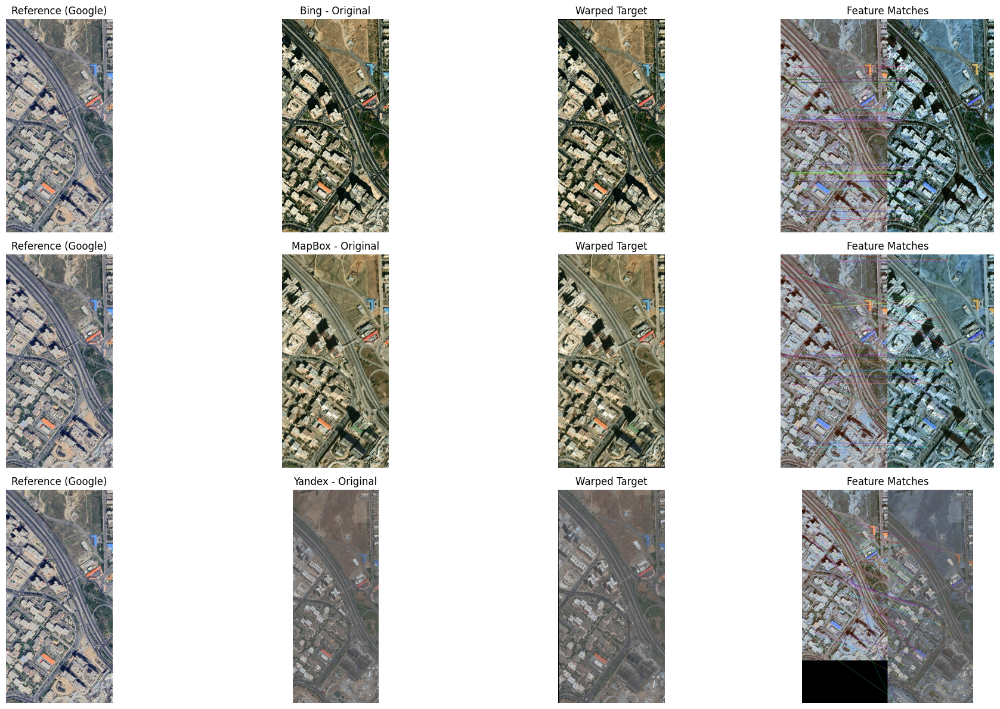


Processing Tile Set: (23)


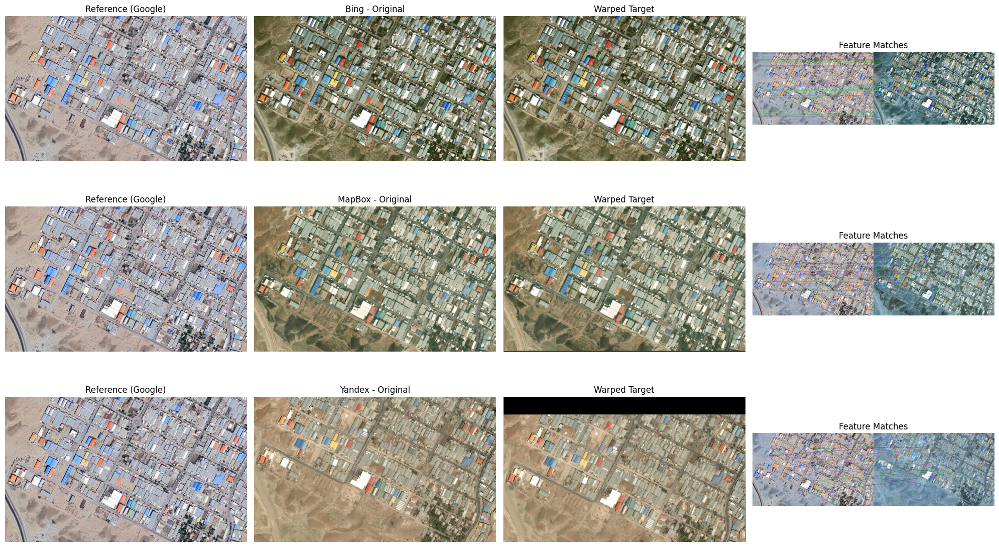


Processing Tile Set: (29)


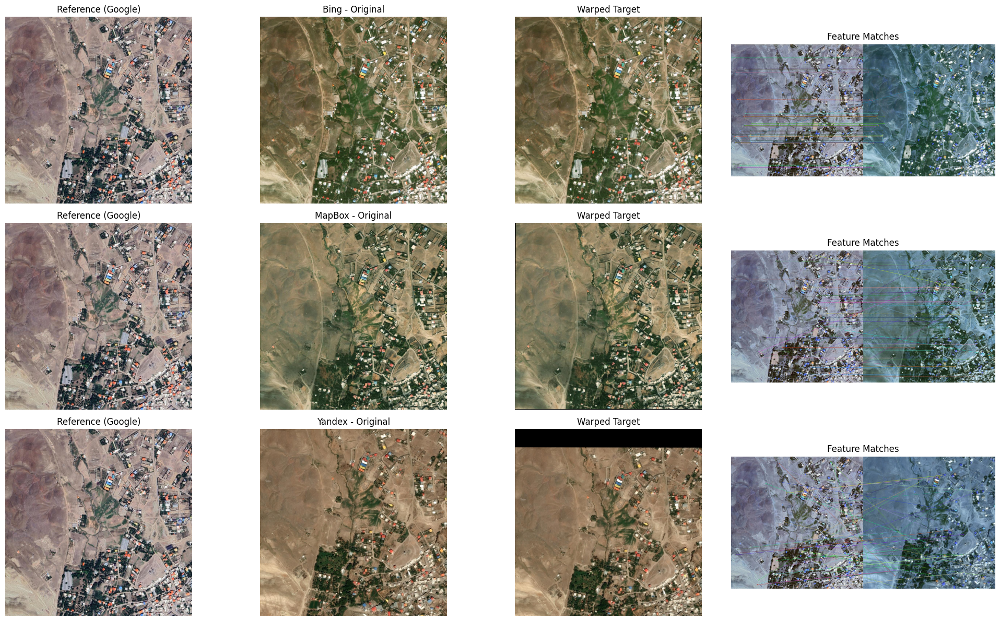

In [15]:
source_names = ["Bing", "MapBox", "Yandex"]
for set_idx, (ref_path, target_paths) in enumerate(zip(reference_sources, target_sets)):
    print(f"\nProcessing Tile Set: {['(0)', '(23)', '(29)'][set_idx]}")

    ref_img = cv2.imread(str(ref_path))
    ref_gray = cv2.cvtColor(ref_img, cv2.COLOR_BGR2GRAY)
    kp_ref, desc_ref = sift.detectAndCompute(ref_gray, None)

    fig, axs = plt.subplots(len(target_paths), 4, figsize=(20, 12))

    for i, target_path in enumerate(target_paths):
        tgt_img = cv2.imread(str(target_path))
        tgt_gray = cv2.cvtColor(tgt_img, cv2.COLOR_BGR2GRAY)
        kp_tgt, desc_tgt = sift.detectAndCompute(tgt_gray, None)

        matches = bf.knnMatch(desc_ref, desc_tgt, k=2)
        good_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]

        # Compute Homography
        if len(good_matches) >= 4:
            src_pts = np.float32([kp_ref[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp_tgt[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

            H, _ = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
            warped_tgt = cv2.warpPerspective(tgt_img, H, (ref_img.shape[1], ref_img.shape[0]))

            # Visualizations
            axs[i, 0].imshow(cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB))
            axs[i, 0].set_title("Reference (Google)")
            axs[i, 1].imshow(cv2.cvtColor(tgt_img, cv2.COLOR_BGR2RGB))
            axs[i, 1].set_title(f"{source_names[i]} - Original")
            axs[i, 2].imshow(cv2.cvtColor(warped_tgt, cv2.COLOR_BGR2RGB))
            axs[i, 2].set_title("Warped Target")
            match_img = cv2.drawMatches(ref_img, kp_ref, tgt_img, kp_tgt, good_matches[:50], None, flags=2)
            axs[i, 3].imshow(match_img)
            axs[i, 3].set_title("Feature Matches")
        else:
            for j in range(4):
                axs[i, j].text(0.5, 0.5, 'Not enough matches', ha='center')
                axs[i, j].axis('off')

        for j in range(4):
            axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()